In [1]:
import os,sys
import scanpy as sc
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

# install MEBOCOST from https://github.com/zhengrongbin/MEBOCOST
from mebocost import mebocost

## Prediction of metabolic interactions between cell types in GBM microenvironment
<p> We first analyzed Darmanis et al.'s scRNA-seq data (GSE84465) to identify cell types and process data for downstream analysis. 3,589 cells passed quality control and various cell types including neoplastic cells, myeloids, astrocytes, oligodendrocytes, oligodendrocyte progenitor cells (OPC), neurons, and vascular cells were identified. Raw reads were log-normalized with scale factor of 10,000 and saved in .h5 format. These preprocessing steps can be found in (./single_cell_analysis/scRNA_analysis_Darmanis.R).

MEBOCOST (https://github.com/zhengrongbin/MEBOCOST) was used to infer a communication score between combinations of cell types for various metabolites based on metabolite presence and gene expression of metabolite transporters.</p>

### 1. Read scRNA-seq expression data and cell annotation data from scanpy object

In [2]:
adata = sc.read_10x_h5('./counts_darmanis.h5')
metadata = pd.read_csv('./metadata_darmanis.csv', 
                           index_col = 0)
adata.obs['celltype'] = metadata['major_cell_type']
print(adata) # (cells, genes)


AnnData object with n_obs × n_vars = 3589 × 23368
    obs: 'celltype'
    var: 'gene_ids', 'feature_types', 'genome'


### 2. Cell-cell metabolic communication inference

In [3]:
# initiate the mebocost object
# 1. pass expression data by scanpy adata object
mebo_obj = mebocost.create_obj(
                        adata = adata,
                        group_col = ['celltype'],
                        met_est = 'mebocost',
                        config_path = './mebocost.conf',
                        exp_mat=None,
                        cell_ann=None,
                        species='human',
                        met_pred=None,
                        met_enzyme=None,
                        met_sensor=None,
                        met_ann=None,
                        scFEA_ann=None,
                        compass_met_ann=None,
                        compass_rxn_ann=None,
                        gene_network=None,
                        gmt_path=None,
                        cutoff_exp='auto', # automated cutoff to exclude lowly ranked 25% sensors across all cells
                        cutoff_met='auto', # automated cutoff to exclude lowly ranked 25% metabolites across all cells
                        cutoff_prop=0.25, # at least 25% of cells should be expressed the sensor or present the metabolite in the cell group (specified by group_col)
                        sensor_type=['Receptor', 'Transporter', 'Nuclear Receptor'],
                        thread=8
                        )
# metabolic communication inference
# Note: by default, this function include estimator for metabolite abundance
commu_res = mebo_obj.infer_commu(
                                n_shuffle=1000,
                                seed=12345, 
                                Return=True, 
                                thread=None,
                                save_permuation=False,
                                min_cell_number = 1
                            )

# save MEBOCOST object as pickle
mebocost.save_obj(obj = mebo_obj, path = './darmanis_MEBOCOST_output/mebocost_darmanis.pk')
print('sensor_exp cutoff: %s'%mebo_obj.cutoff_exp)
print('metabolite_presence cutoff: %s'%mebo_obj.cutoff_met)
cutoff_df = pd.DataFrame(columns = ['sensor_exp', 'metabolite_presence'], 
                         index = ['darmanis_tumor'])
cutoff_df.loc['darmanis_tumor'] = [mebo_obj.cutoff_exp, mebo_obj.cutoff_met]

[July 12, 2024 15:27:41]: We get expression data with 23368 genes and 3589 cells.
[July 12, 2024 15:27:41]: Data Preparation Done in 0.0697 seconds
[July 12, 2024 15:27:41]: Load config and read data based on given species [human].
[July 12, 2024 15:27:43]: Estimtate metabolite level using mebocost
[July 12, 2024 15:27:53]: Infer communications
[July 12, 2024 15:27:53]: Sensor type used ['Transporter', 'Receptor', 'Nuclear Receptor']
[July 12, 2024 15:27:53]: Parameters: {shuffling: 1000 times, random seed: 12345, thread: 8}
[July 12, 2024 15:27:54]: met_sensor: (376, 8)
[July 12, 2024 15:27:54]: avg_exp: (2280, 7) for (gene, cell) of needed
[July 12, 2024 15:27:54]: avg_met: (599, 7) for (metabolite, cell) of needed
[July 12, 2024 15:27:54]: shuffling 1000 times for generating backgroud
[July 12, 2024 15:27:55]: take exp and met avg for shuffling
[July 12, 2024 15:28:01]: thread: 8
[July 12, 2024 15:28:30]: Calculating aboundance of metabolite and sensor expression in cell groups
[Jul

### 3. Visualize result of MEBOCOST prediction

#### 3.1. Summary of the number of communication events

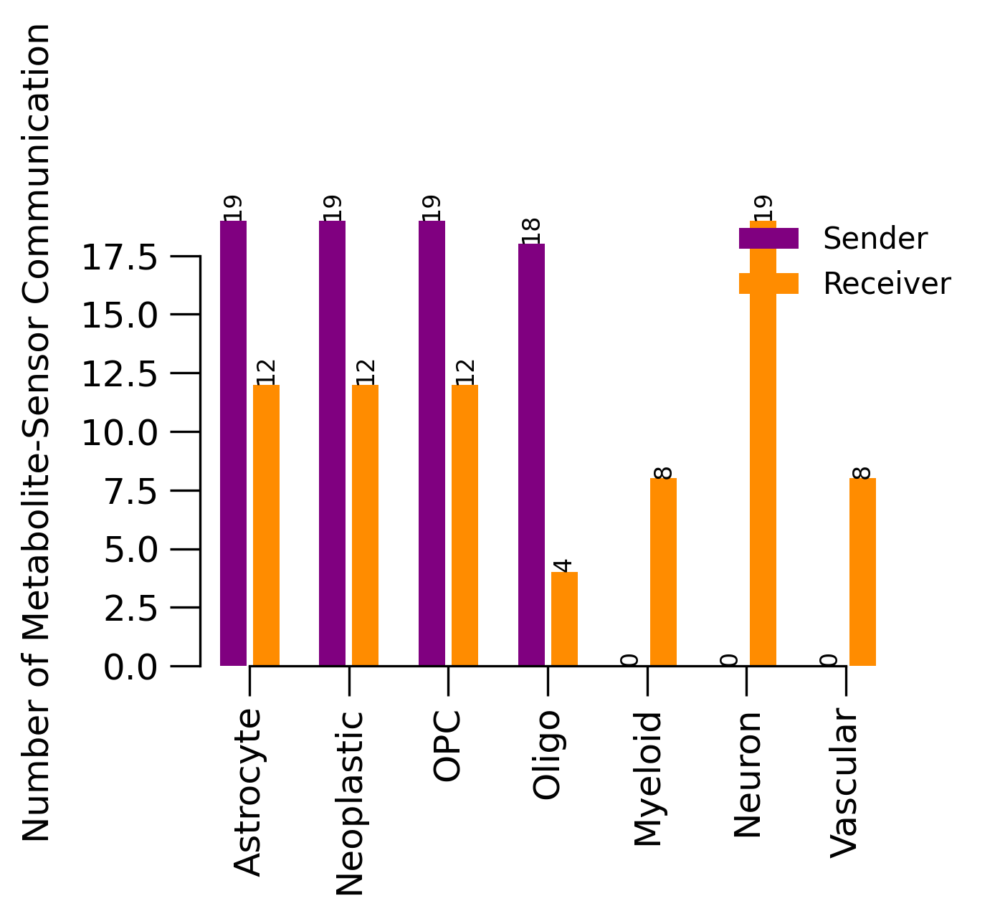

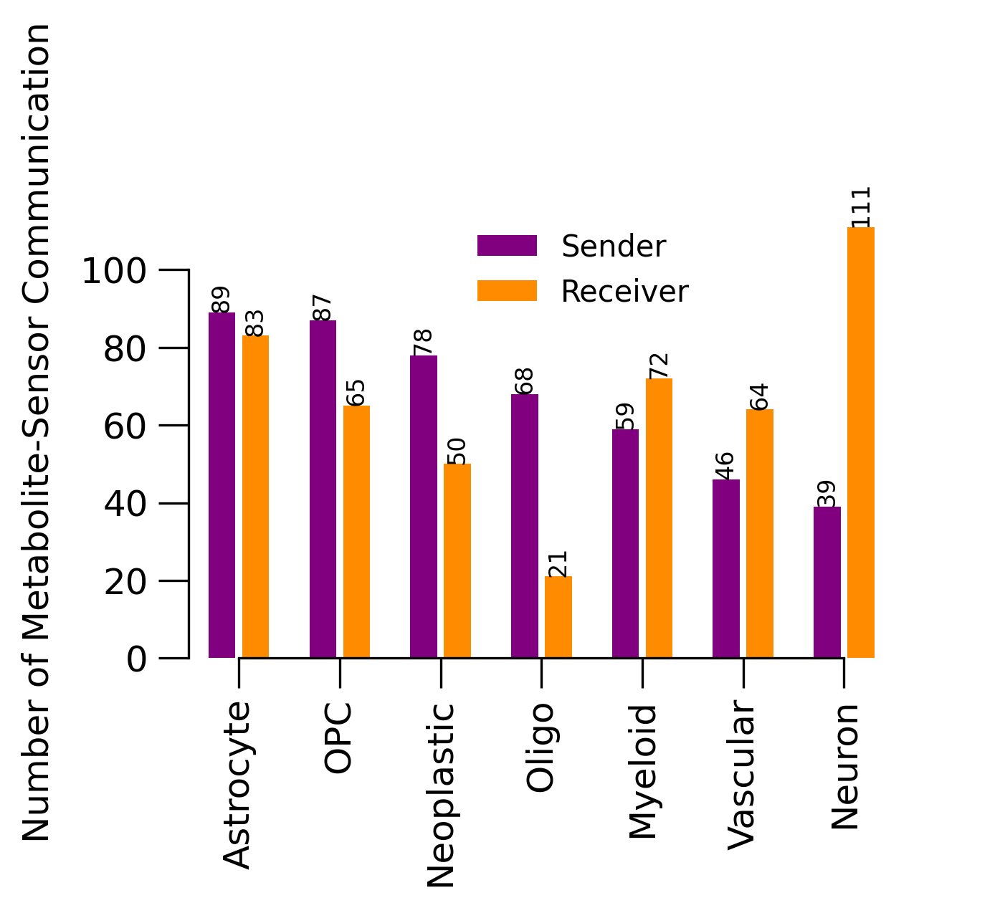

In [4]:
# sender and receiver event number
# summary of the number of communication events for serine
mebo_obj.eventnum_bar(
                    sender_focus=[],
                    metabolite_focus=['L-Serine'],
                    sensor_focus=[],
                    receiver_focus=[],
                    and_or='and',
                    pval_method='permutation_test_fdr',
                    pval_cutoff=0.05,
                    comm_score_col='Commu_Score',
                    comm_score_cutoff = 0,
                    cutoff_prop = 0.25,
                    figsize='auto',
                    save='./darmanis_MEBOCOST_output/eventnum_bar_SER.pdf',
                    show_plot=True,
                    show_num = True,
                    include=['sender-receiver'],
                    group_by_cell=True,
                    colorcmap='tab20',
                    return_fig=False
                )
# summary of the number of communication events for all metabolites
mebo_obj.eventnum_bar(
                    sender_focus=[],
                    metabolite_focus=[],
                    sensor_focus=[],
                    receiver_focus=[],
                    and_or='and',
                    pval_method='permutation_test_fdr',
                    pval_cutoff=0.05,
                    comm_score_col='Commu_Score',
                    comm_score_cutoff = 0,
                    cutoff_prop = 0.25,
                    figsize='auto',
                    save='./darmanis_MEBOCOST_output/eventnum_bar.pdf',
                    show_plot=True,
                    show_num = True,
                    include=['sender-receiver'],
                    group_by_cell=True,
                    colorcmap='tab20',
                    return_fig=False
                )

#### 3.2. Summay of communication in cell-to-cell network

[July 12, 2024 15:32:31]: show communication in cells by network plot


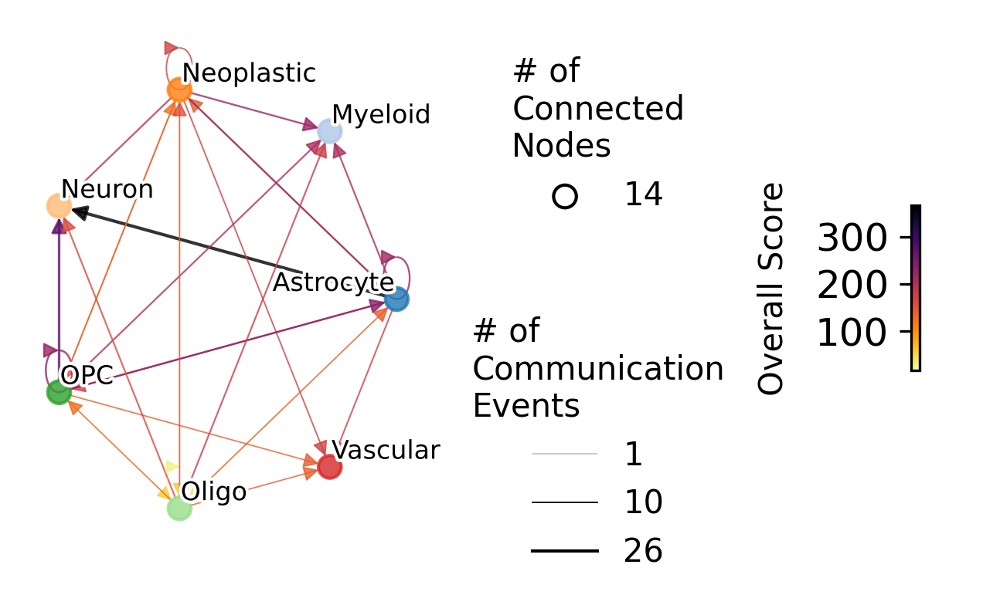

[July 12, 2024 15:32:33]: show communication in cells by network plot


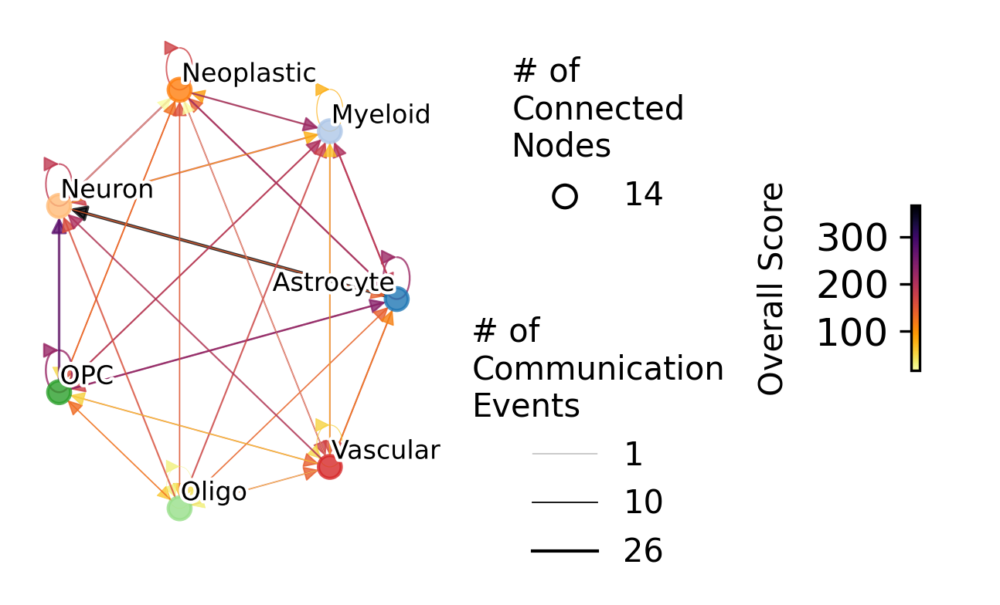

In [5]:
# circle plot to show communications between cell groups
# summay of communication in cell-to-cell network for serine
mebo_obj.commu_network_plot(
                    sender_focus=[],
                    metabolite_focus=['L-Serine'],
                    sensor_focus=[],
                    receiver_focus=[],
                    and_or='and',
                    pval_method='permutation_test_fdr',
                    pval_cutoff=0.05,
                    node_cmap='tab20',
                    figsize='auto',
                    line_cmap='inferno_r',
                    line_color_vmin=None,
                    line_color_vmax=None,
                    #linewidth_norm=(0.5, 5),
                    #node_size_norm=(50, 200),
                    adjust_text_pos_node=True,
                    node_text_hidden = False,
                    node_text_font=8,
                    save='./darmanis_MEBOCOST_output/commu_network_plot_SER.pdf',
                    show_plot=True,
                    comm_score_col='Commu_Score',
                    comm_score_cutoff=0,
                    text_outline=True,
                    return_fig=False
                )

mebo_obj.commu_network_plot(
                    sender_focus=[],
                    metabolite_focus=[],
                    sensor_focus=[],
                    receiver_focus=[],
                    and_or='and',
                    pval_method='permutation_test_fdr',
                    pval_cutoff=0.05,
                    node_cmap='tab20',
                    figsize='auto',
                    line_cmap='inferno_r',
                    line_color_vmin=None,
                    line_color_vmax=None,
                    #linewidth_norm=(0.5, 5),
                    #node_size_norm=(50, 200),
                    adjust_text_pos_node=True,
                    node_text_hidden = False,
                    node_text_font=8,
                    save='./darmanis_MEBOCOST_output/commu_network_plot.pdf',
                    show_plot=True,
                    comm_score_col='Commu_Score',
                    comm_score_cutoff=0,
                    text_outline=True,
                    return_fig=False
                )

#### 3.3. Number of communicationa between sender and receiver cell types in a dot plot

[July 12, 2024 15:35:59]: plot dot plot to show communication in cell type level


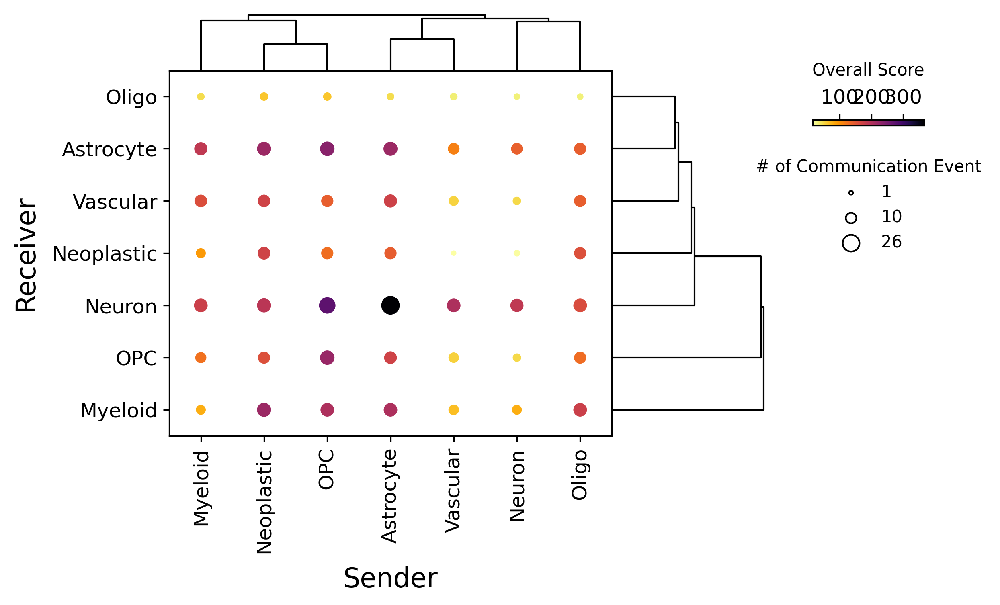

In [6]:
# the "overall score" represent the sum of -log10(FDR) of detected 
# metabolite-sensor communications between a pair of cell types
# dot plot shows the number of communications between cells

mebo_obj.count_dot_plot(
                        pval_method='permutation_test_fdr',
                        pval_cutoff=0.05,
                        cmap='inferno_r',
                        figsize='auto',
                        save= './darmanis_MEBOCOST_output/count_dot_plot.pdf',
                        #dot_size_norm=(20, 200),
                        dot_color_vmin=None,
                        dot_color_vmax=None,
                        show_plot=True,
                        comm_score_col='Commu_Score',
                        comm_score_cutoff=0,
                        return_fig = False
                    )

#### 3.4. Detailed communications (sender-receiver vs metabolite-sensor) in a dot map

[July 12, 2024 15:53:42]: plot heatmap for significant result


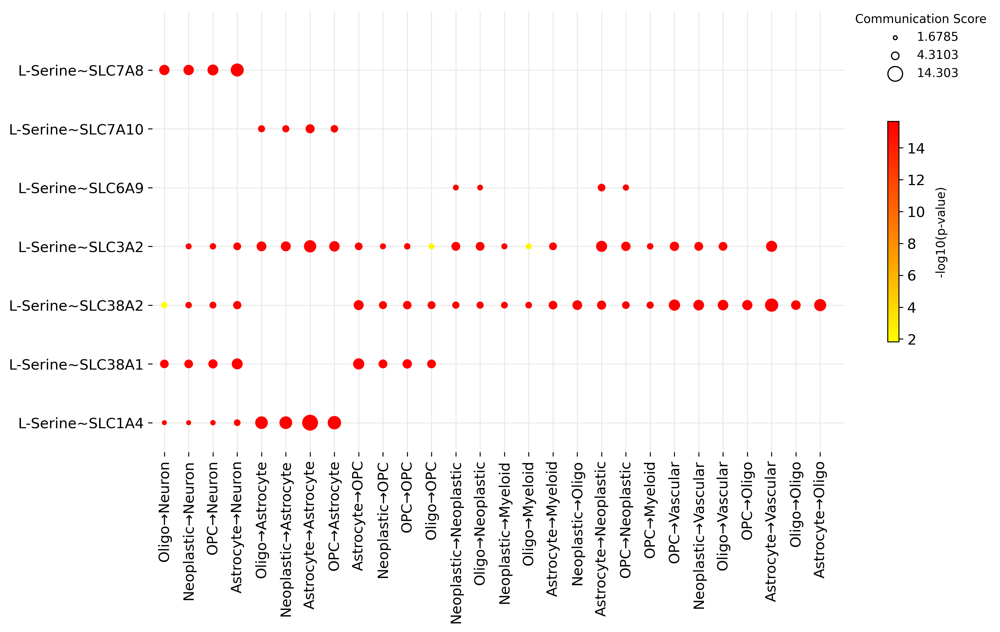

[July 12, 2024 15:53:43]: plot heatmap for significant result


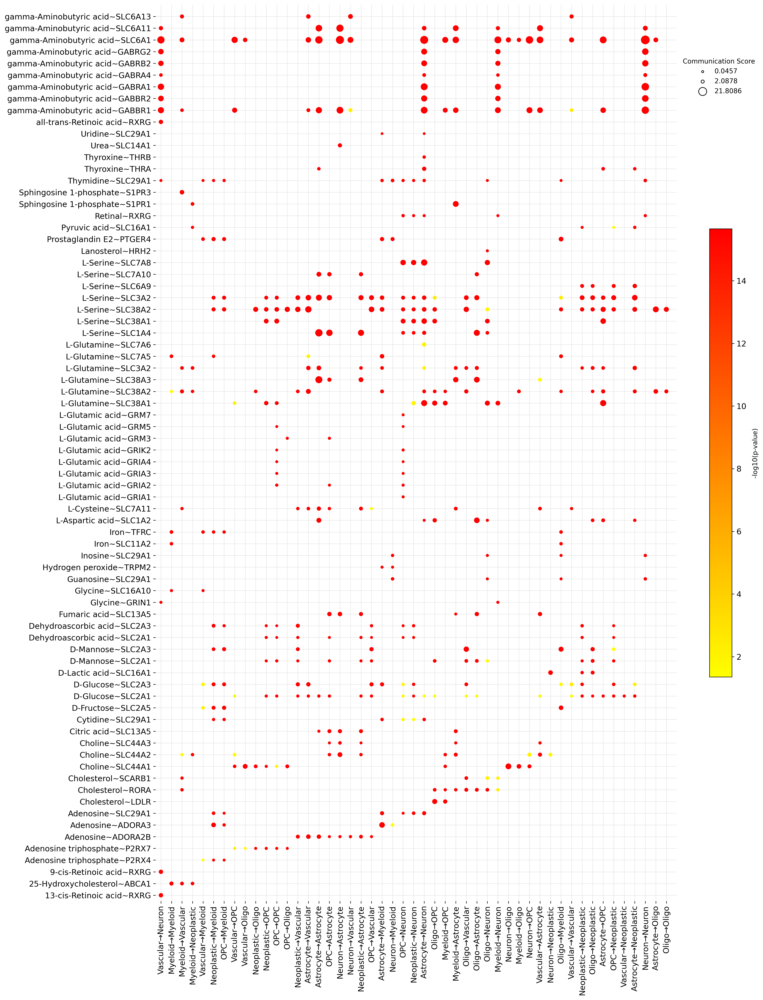

In [7]:
# for serine
mebo_obj.commu_dotmap(
                sender_focus=[],
                metabolite_focus=['L-Serine'],
                sensor_focus=[],
                receiver_focus=[],
                and_or='and',
                pval_method='permutation_test_fdr',
                pval_cutoff=0.05,
                figsize='auto',
                cmap='autumn_r',
                #node_size_norm=(10, 150),
                save='./darmanis_MEBOCOST_output/commu_dotplot_SER.pdf',
                show_plot=True,
                comm_score_col='Commu_Score',
                comm_score_cutoff=0,
                swap_axis = False,
                return_fig = False
                )
# for all metabolites
mebo_obj.commu_dotmap(
                sender_focus=[],
                metabolite_focus=[],
                sensor_focus=[],
                receiver_focus=[],
                and_or='and',
                pval_method='permutation_test_fdr',
                pval_cutoff=0.05,
                figsize='auto',
                cmap='autumn_r',
                #node_size_norm=(10, 150),
                save='./darmanis_MEBOCOST_output/commu_dotplot.pdf',
                show_plot=True,
                comm_score_col='Commu_Score',
                comm_score_cutoff=0,
                swap_axis = False,
                return_fig = False
                )

#### 3.5. Visualization of the communication flow from sender metabolite to sensor in receiver

[July 12, 2024 15:58:21]: plot flow plot to show the communications from Sender -> Metabolite -> Sensor -> Receiver


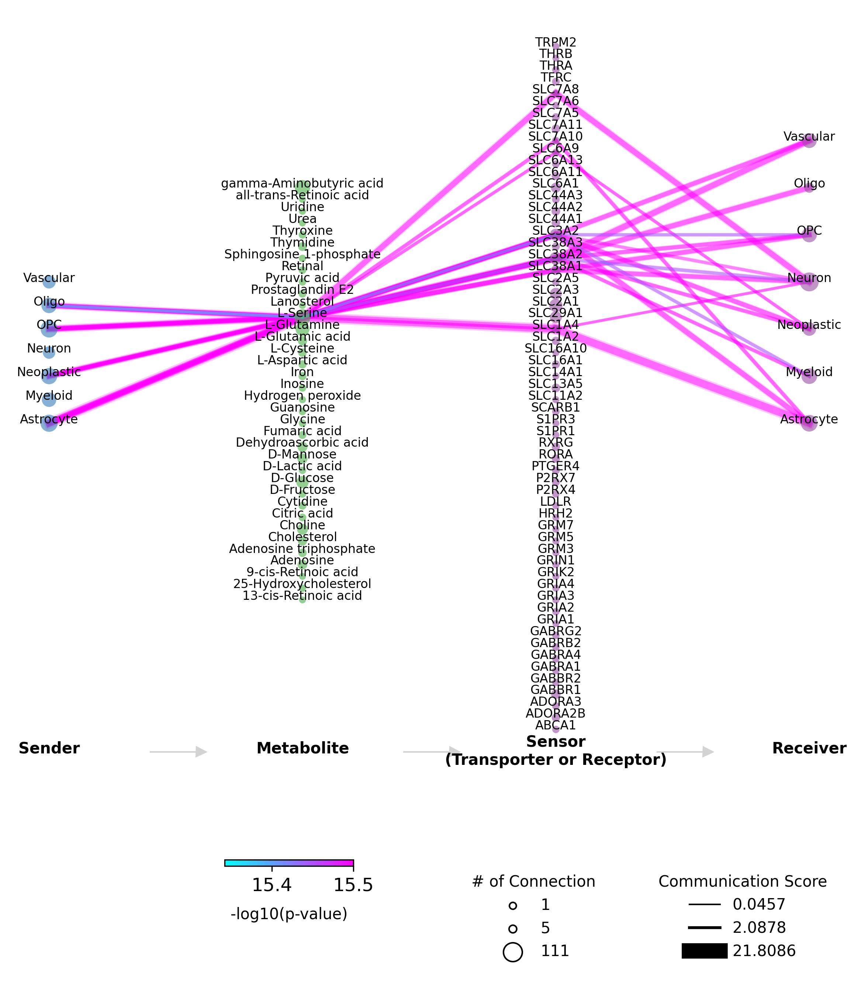

[July 12, 2024 15:58:22]: plot flow plot to show the communications from Sender -> Metabolite -> Sensor -> Receiver


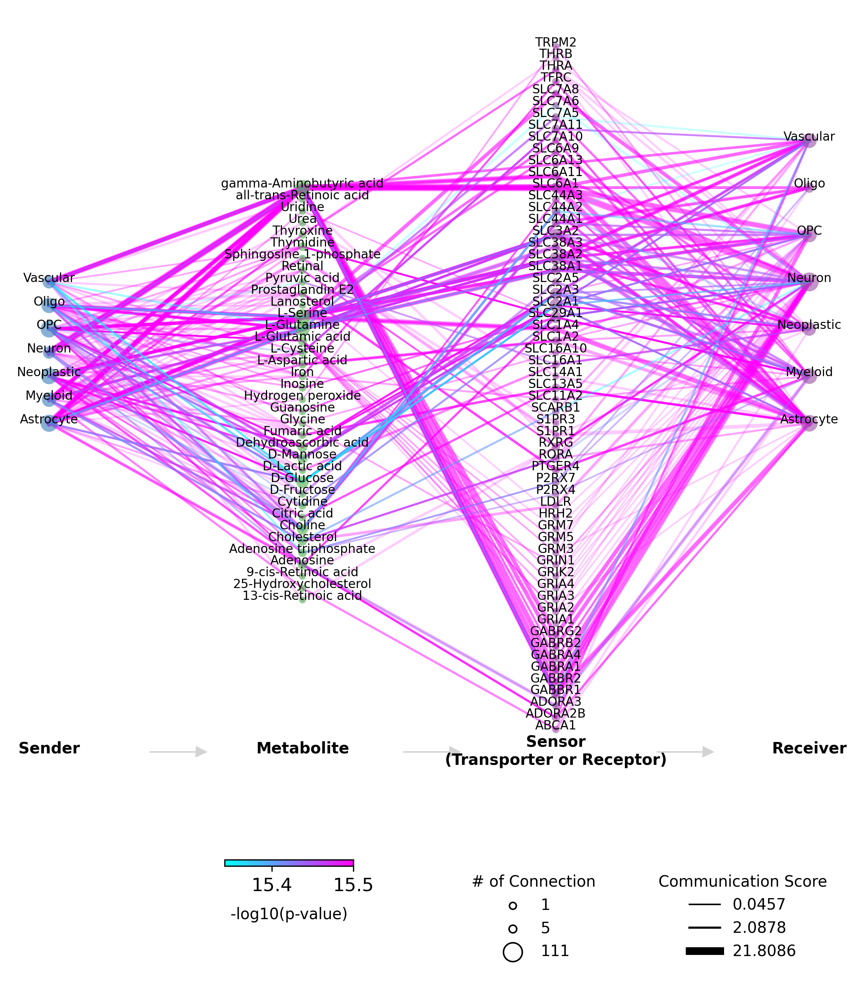

In [8]:
# for serine
mebo_obj.FlowPlot(
                pval_method='permutation_test_fdr',
                pval_cutoff=0.05,
                sender_focus=[],
                metabolite_focus=['L-Serine'],
                sensor_focus=[],
                receiver_focus=[],
                remove_unrelevant = False,
                and_or='and',
                node_label_size=8,
                node_alpha=0.6,
                figsize='auto',
                node_cmap='Set1',
                line_cmap='cool',
                line_vmin = None,
                line_vmax = 15.5,
                node_size_norm=(20, 150),
                linewidth_norm=(1, 10),
                save='./darmanis_MEBOCOST_output/FlowPlot_SER.pdf',
                show_plot=True,
                comm_score_col='Commu_Score',
                comm_score_cutoff=0,
                text_outline=False,
                return_fig = False
            )
# for all metabolites
mebo_obj.FlowPlot(
                pval_method='permutation_test_fdr',
                pval_cutoff=0.05,
                sender_focus=[],
                metabolite_focus=[],
                sensor_focus=[],
                receiver_focus=[],
                remove_unrelevant = False,
                and_or='and',
                node_label_size=8,
                node_alpha=0.6,
                figsize='auto',
                node_cmap='Set1',
                line_cmap='cool',
                line_vmin = None,
                line_vmax = 15.5,
                node_size_norm=(20, 150),
                linewidth_norm=(1, 5),
                save='./darmanis_MEBOCOST_output/FlowPlot.pdf',
                show_plot=True,
                comm_score_col='Commu_Score',
                comm_score_cutoff=0,
                text_outline=False,
                return_fig = False
            )

#### 3.6. Visualization of the metabolite level or sensor expression in cell types

[July 12, 2024 15:59:05]: Warnings: no sensors to plot
[July 12, 2024 15:59:05]: Find metabolites ['Dehydroascorbic acid', 'Retinal', 'Adenosine', 'Citric acid', 'Cholesterol', 'L-Cysteine', 'Guanosine', 'Pyruvic acid', 'Iron', 'L-Aspartic acid', 'D-Fructose', 'all-trans-Retinoic acid', 'gamma-Aminobutyric acid', '9-cis-Retinoic acid', 'Fumaric acid', 'Choline', 'Sphingosine 1-phosphate', 'L-Glutamine', 'Inosine', '13-cis-Retinoic acid', 'Urea', '25-Hydroxycholesterol', 'Uridine', 'Thyroxine', 'Cytidine', 'Adenosine triphosphate', 'Hydrogen peroxide', 'Glycine', 'D-Lactic acid', 'Prostaglandin E2', 'Thymidine', 'L-Glutamic acid', 'Lanosterol', 'D-Glucose', 'L-Serine', 'D-Mannose'] to plot violin


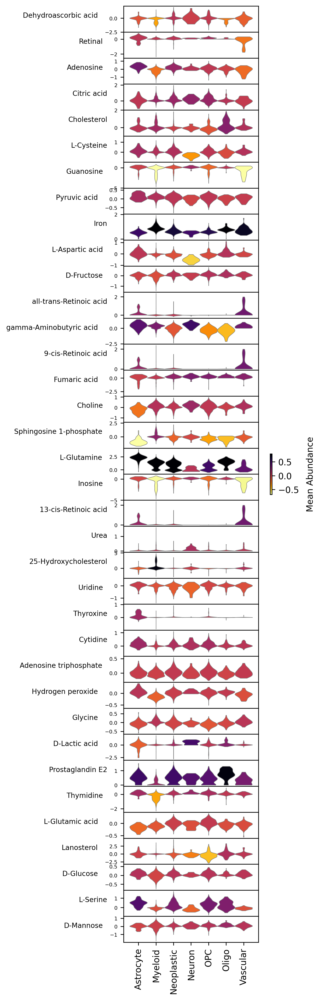

[July 12, 2024 15:59:09]: Find genes Index(['ABCA1', 'ADORA2B', 'ADORA3', 'GABBR1', 'GABBR2', 'GABRA1', 'GABRA4',
       'GABRB2', 'GABRG2', 'GRIA1', 'GRIA2', 'GRIA3', 'GRIA4', 'GRIK2',
       'GRIN1', 'GRM3', 'GRM5', 'GRM7', 'HRH2', 'LDLR', 'P2RX4', 'P2RX7',
       'PTGER4', 'RORA', 'RXRG', 'S1PR1', 'S1PR3', 'SCARB1', 'SLC11A2',
       'SLC13A5', 'SLC14A1', 'SLC16A1', 'SLC16A10', 'SLC1A2', 'SLC1A4',
       'SLC29A1', 'SLC2A1', 'SLC2A3', 'SLC2A5', 'SLC38A1', 'SLC38A2',
       'SLC38A3', 'SLC3A2', 'SLC44A1', 'SLC44A2', 'SLC44A3', 'SLC6A1',
       'SLC6A11', 'SLC6A13', 'SLC6A9', 'SLC7A10', 'SLC7A11', 'SLC7A5',
       'SLC7A6', 'SLC7A8', 'TFRC', 'THRA', 'THRB', 'TRPM2'],
      dtype='object') to plot violin


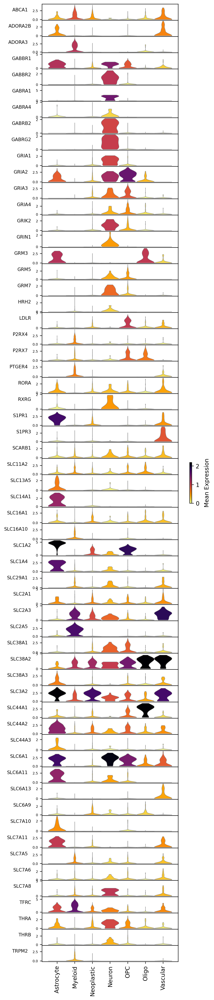

[July 12, 2024 15:59:14]: Warnings: no metabolites to plot


In [9]:
commu_df = mebo_obj.commu_res.copy()
commu_df.to_csv('./darmanis_MEBOCOST_output/commu_df.csv')
commu_df = commu_df[(commu_df['permutation_test_fdr']<=0.05)]

commu_df_sorted = commu_df.sort_values('Commu_Score', ascending = False)
good_met = commu_df_sorted['Metabolite_Name'].unique()

mebo_obj.violin_plot(
                    sensor_or_met=good_met[:], 
                    cell_focus=[],
                    cmap='inferno_r',
                    vmin=None,
                    vmax=None,
                    figsize='auto',
                    cbar_title='',
                    save='./darmanis_MEBOCOST_output/violin_plot_metab.pdf',
                    show_plot=True
                    )
good_sensor = commu_df_sorted['Sensor'].unique()

mebo_obj.violin_plot(
                    sensor_or_met=good_sensor[:],
                    cell_focus=[],
                    cmap='inferno_r',
                    vmin=None,
                    vmax=None,
                    figsize='auto',
                    cbar_title='',
                    save='./darmanis_MEBOCOST_output/violin_plot_sensor.pdf',
                    show_plot=True
                    )
        
cutoff_df.to_csv('./darmanis_MEBOCOST_output/auto_cutoff.csv')